# Your First GAN

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](MnistExamples.png)

In [3]:
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True)
    )

In [5]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)

    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [7]:
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    
    return torch.randn(n_samples,z_dim,device=device)

In [11]:
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2, inplace = True)
    )

In [13]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [15]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)
device = 'cuda'

In [16]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [17]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    fake_noise = get_noise(num_images, z_dim, device = device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    return disc_loss

In [19]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    

    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))

    return gen_loss

![MNIST Digits](https://drive.google.com/uc?export=view&id=1BlfFNZACaieFrOjMv_o2kGqwAR6eiLmN)

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 1.5058196147680278, discriminator loss: 0.4046083711385728


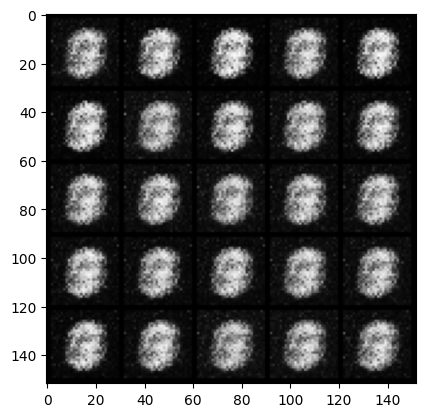

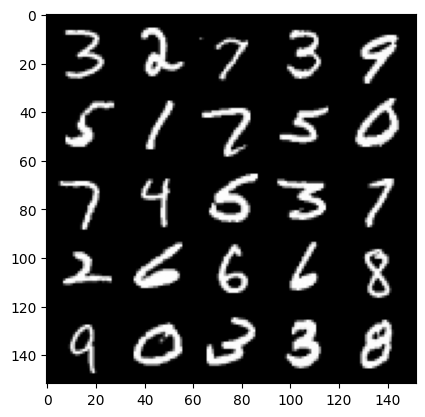

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 1.880927744865416, discriminator loss: 0.25547521352767955


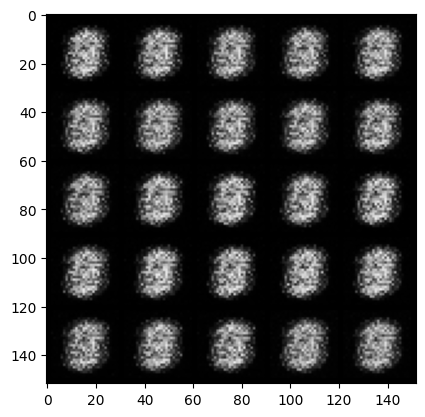

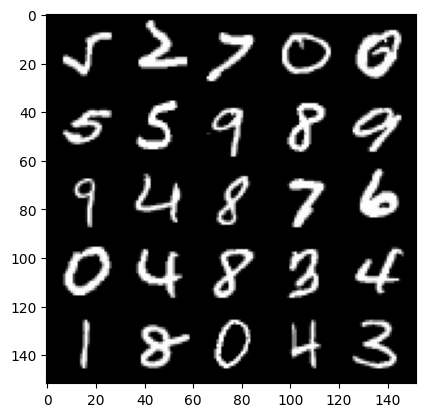

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 2.2210649189949043, discriminator loss: 0.14350183290243154


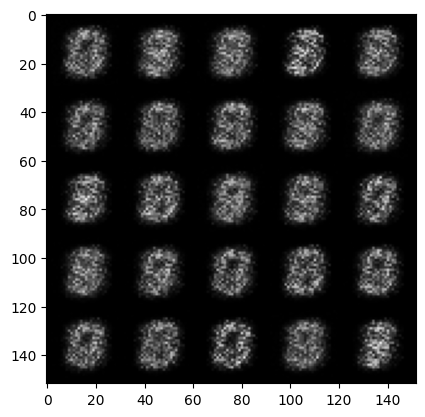

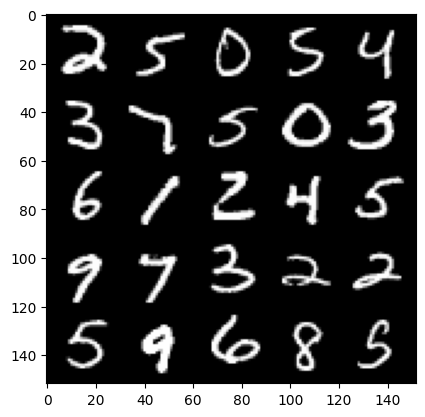

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 1.821029119491578, discriminator loss: 0.2029490402340889


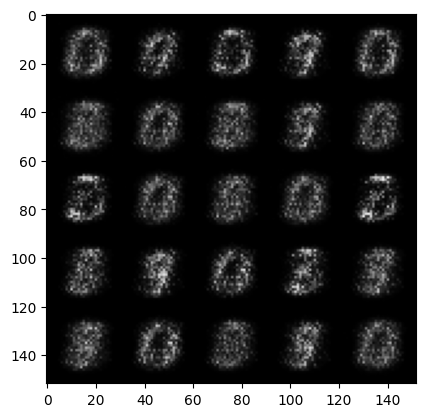

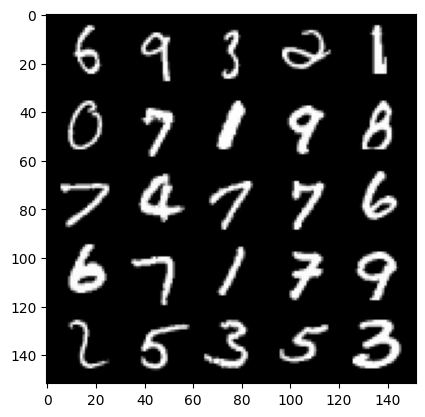

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 1.7327954506874086, discriminator loss: 0.19232801902294175


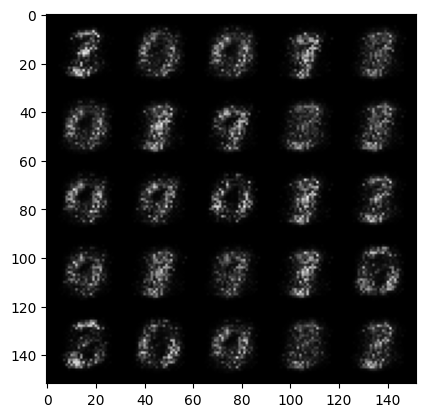

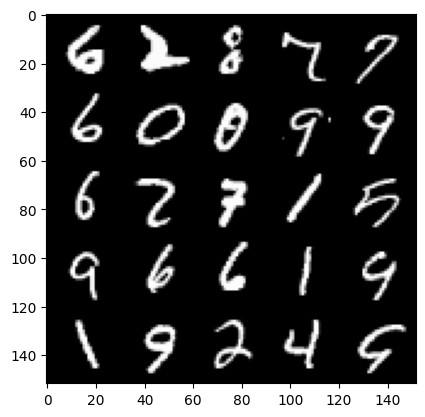

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 2.0115759706497185, discriminator loss: 0.14911827006936076


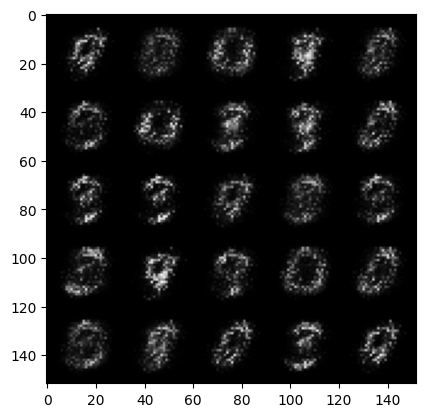

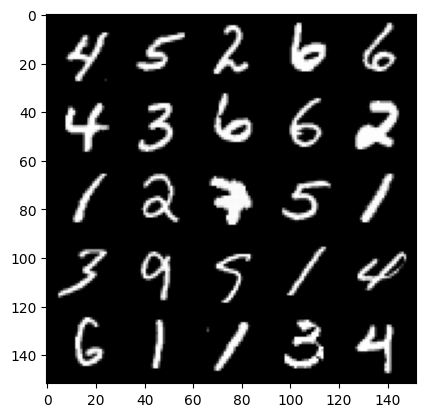

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 2.24246839928627, discriminator loss: 0.14921304464340204


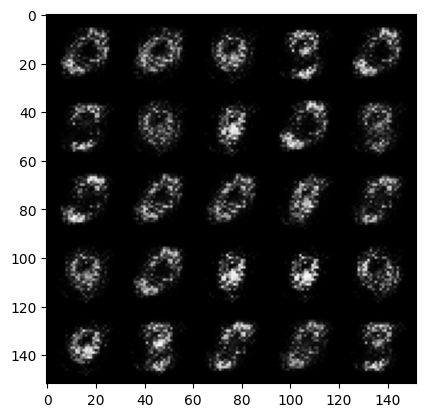

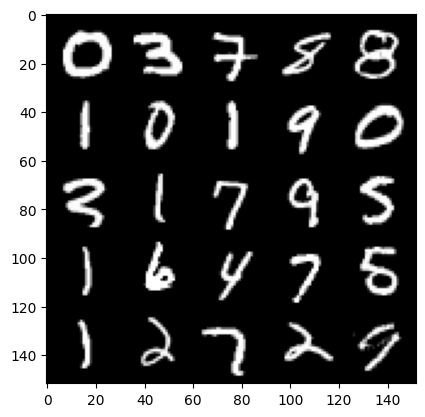

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 2.671687307834629, discriminator loss: 0.11565135397016994


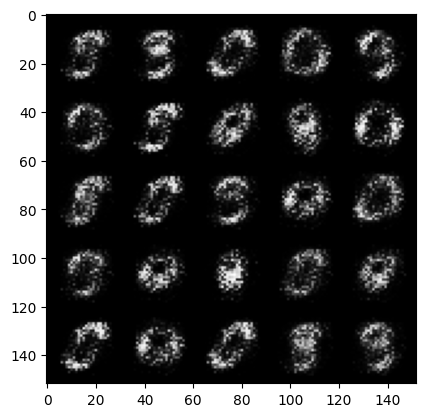

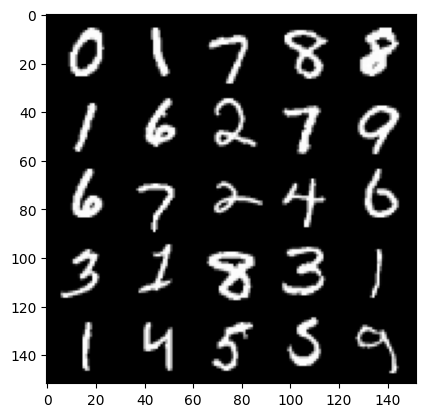

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 3.1474059453010548, discriminator loss: 0.0855468908920884


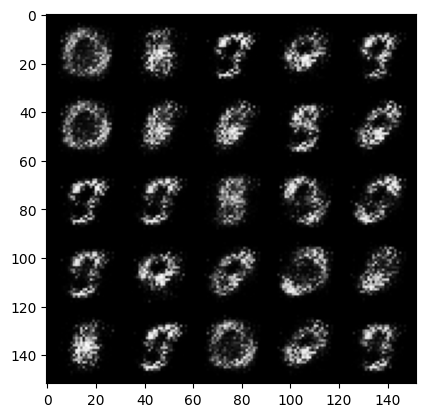

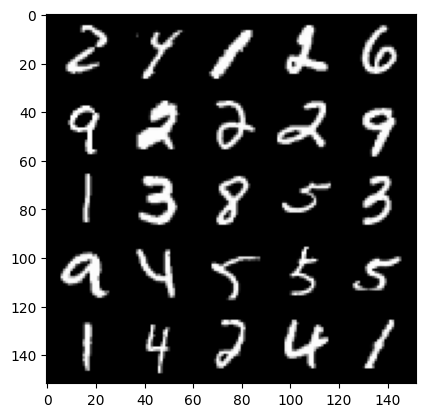

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 3.3832201972007714, discriminator loss: 0.08739224798232312


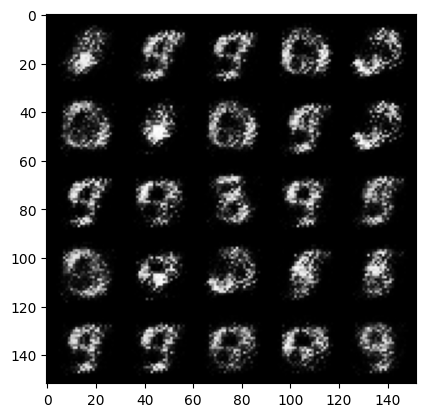

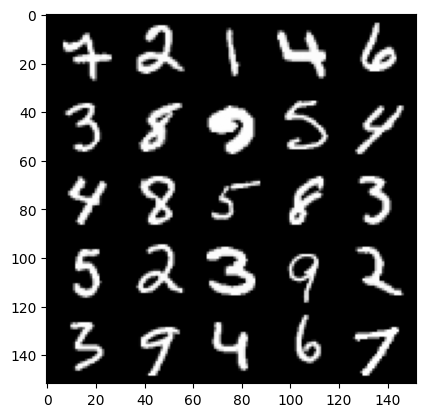

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 3.5479228658676196, discriminator loss: 0.08606413840502511


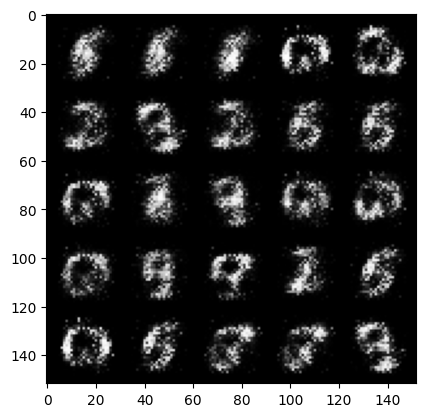

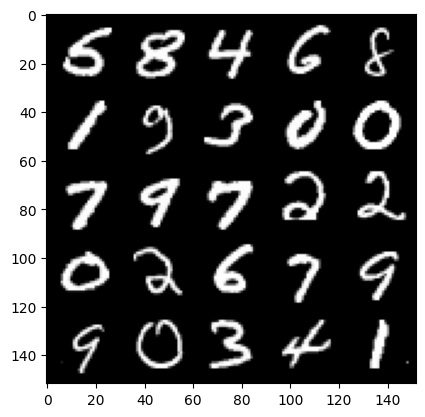

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 3.750942724704744, discriminator loss: 0.06777768833190202


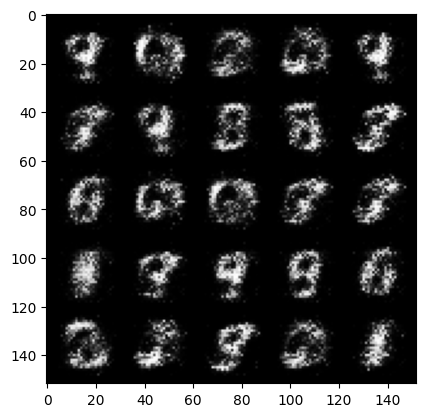

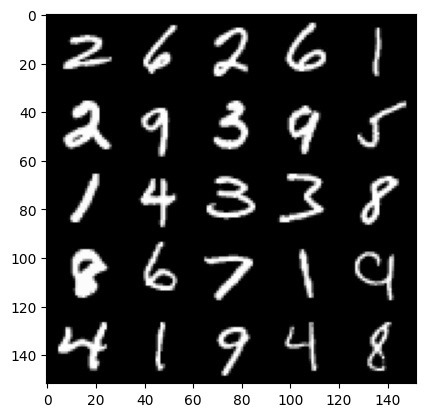

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 3.7247278199195843, discriminator loss: 0.06593678594380621


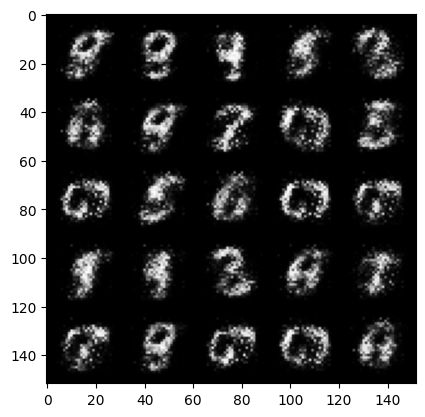

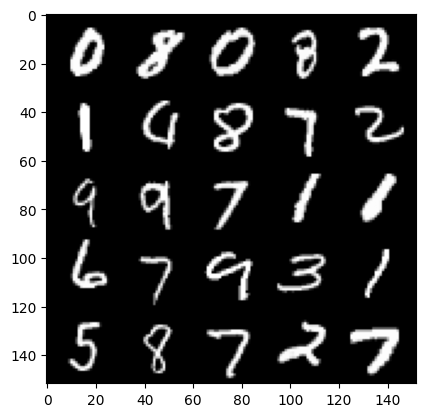

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 3.7816748981475827, discriminator loss: 0.06530948983877898


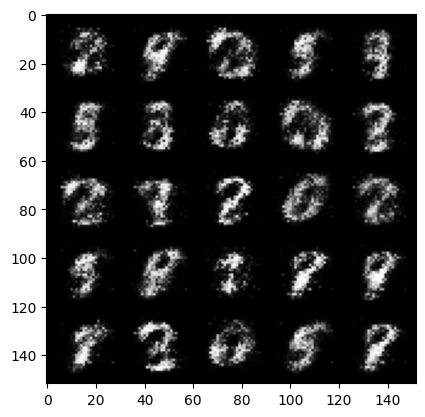

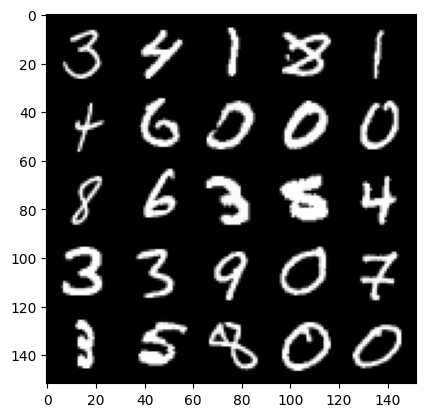

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 3.742022825241092, discriminator loss: 0.06348986992985006


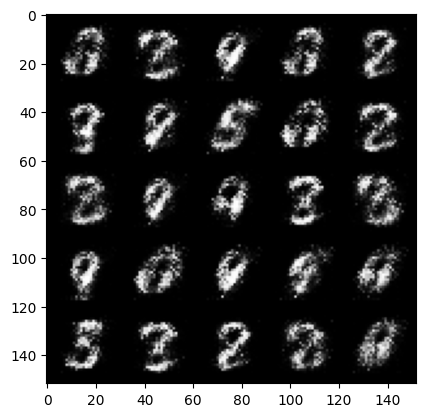

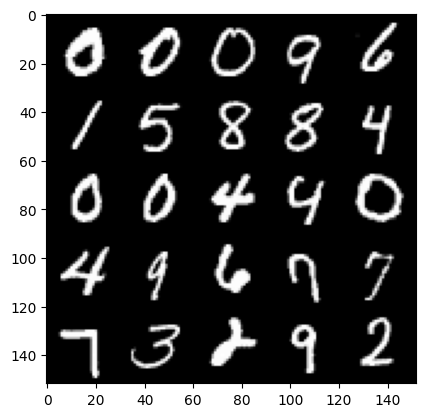

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 3.9744927387237543, discriminator loss: 0.060116219371557214


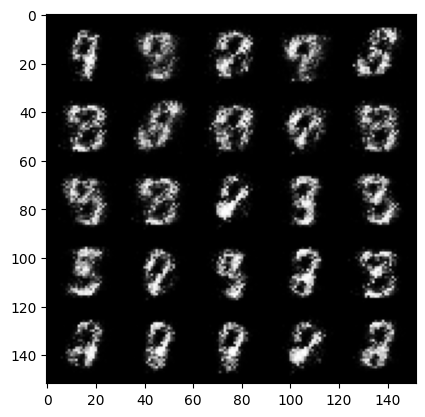

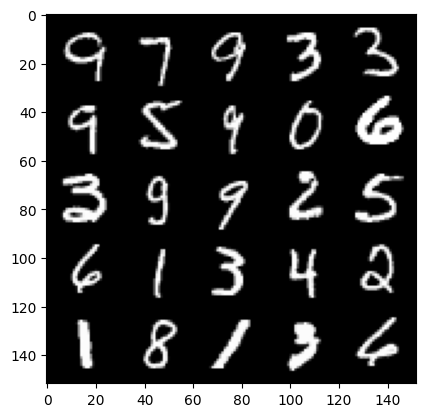

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 3.9948595614433264, discriminator loss: 0.06109242787957192


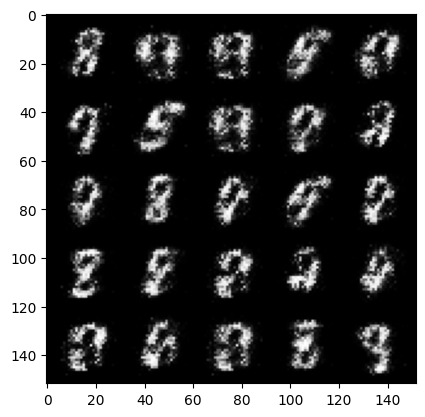

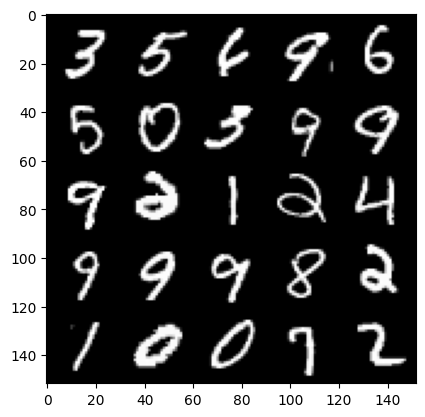

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 4.000582485198977, discriminator loss: 0.06554001706093548


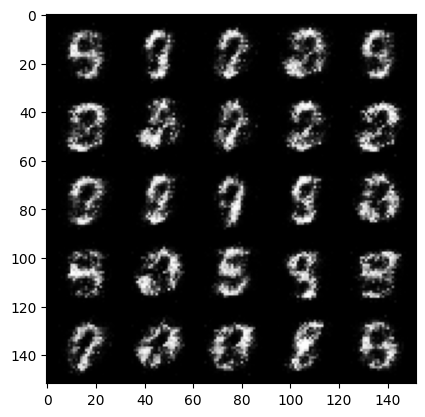

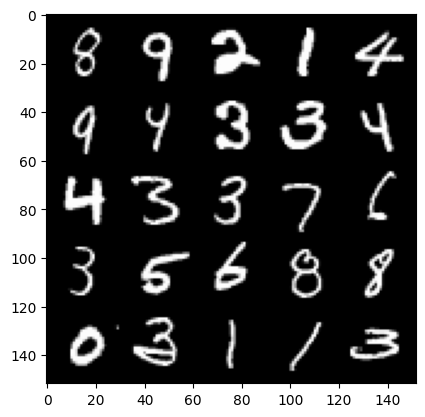

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 3.731310359477994, discriminator loss: 0.07993163294345143


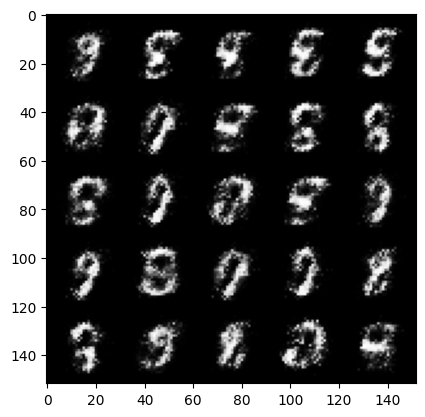

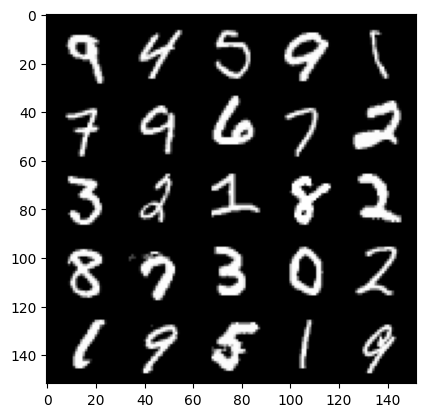

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 3.895183923721309, discriminator loss: 0.06884585805237291


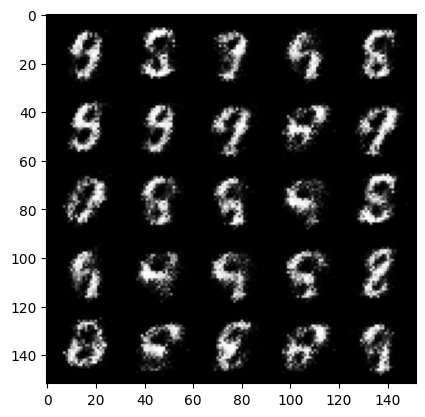

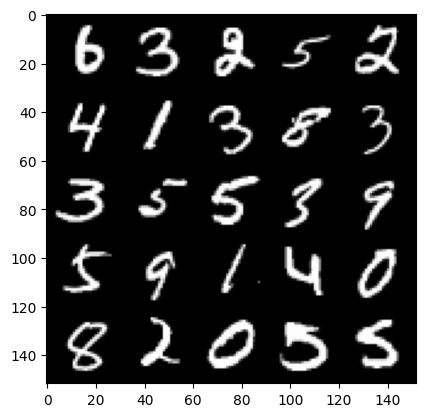

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 4.065049622058866, discriminator loss: 0.06980840293318034


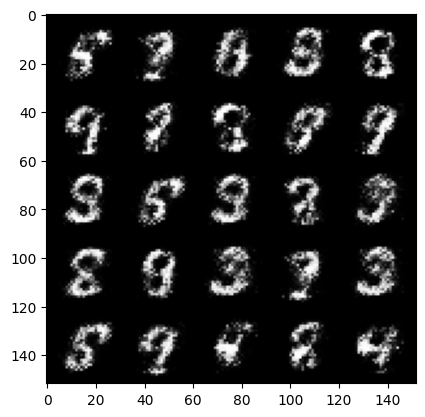

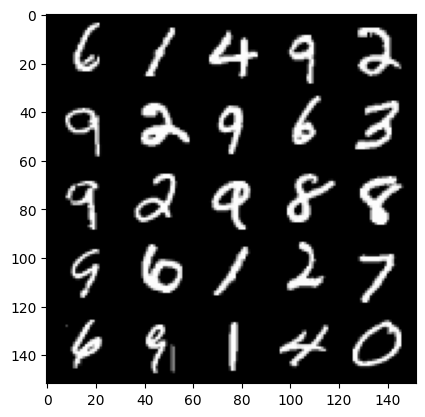

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 4.038301193714144, discriminator loss: 0.07198375689983373


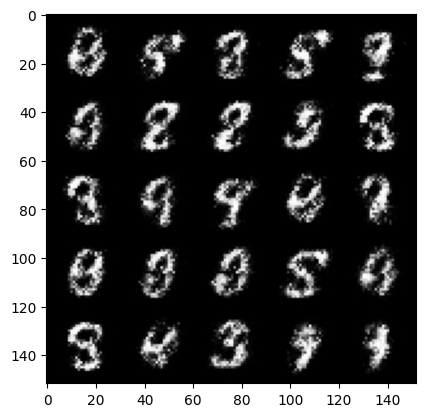

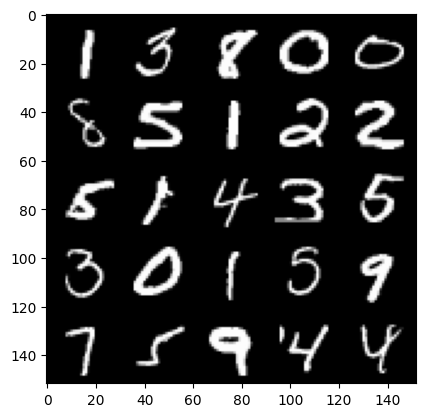

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 3.9853790512084957, discriminator loss: 0.07388951734453433


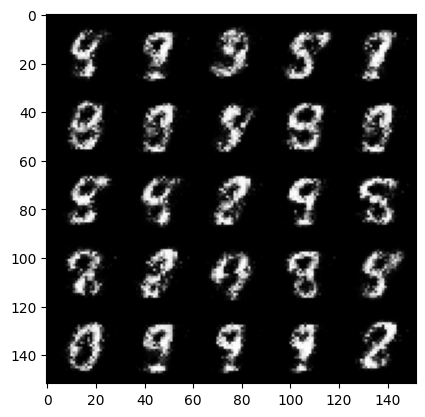

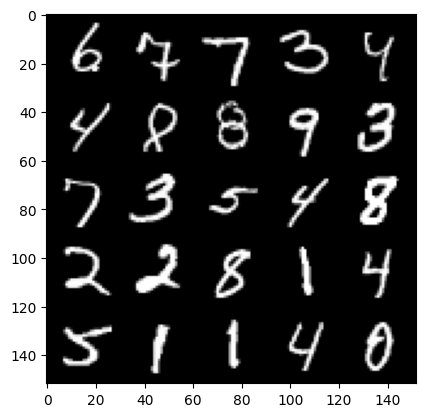

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 4.09194051074982, discriminator loss: 0.0779623371362686


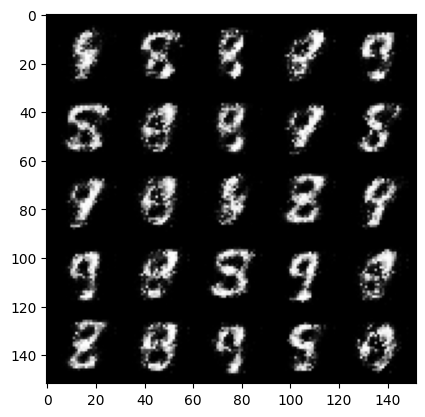

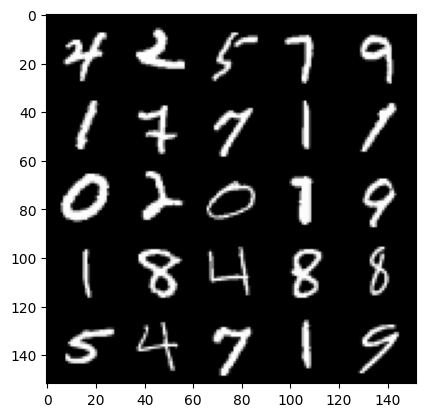

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 3.9713498430252114, discriminator loss: 0.0804632027596235


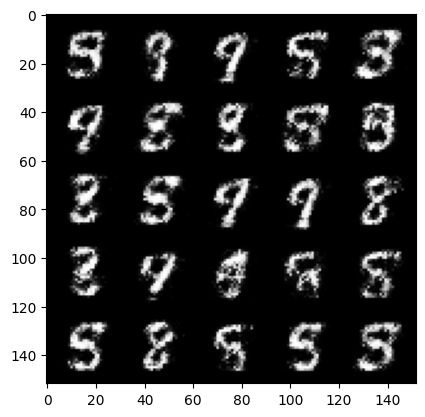

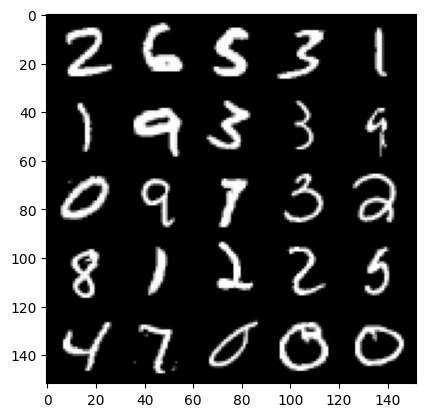

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 3.7953692398071297, discriminator loss: 0.09768730011582376


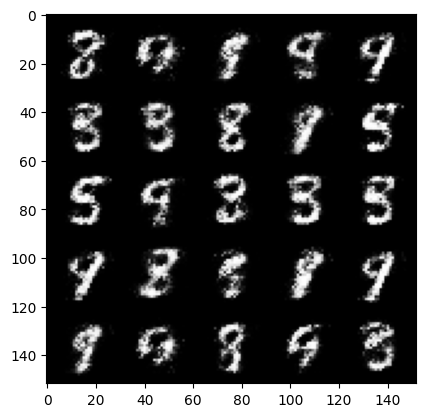

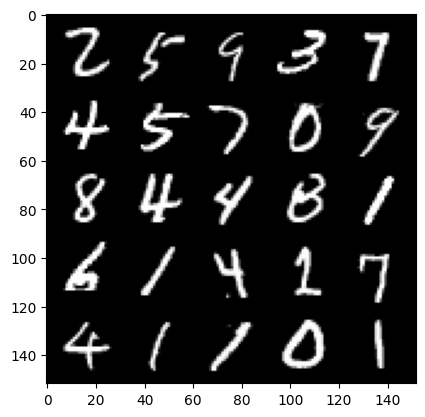

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 3.8348288388252225, discriminator loss: 0.09113359497487533


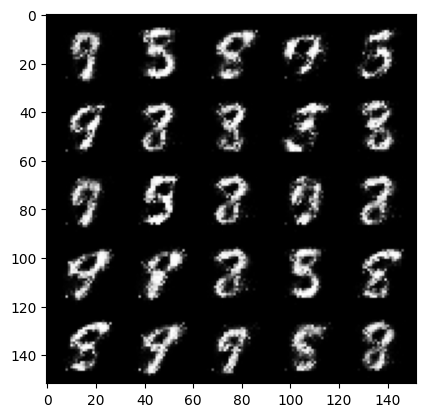

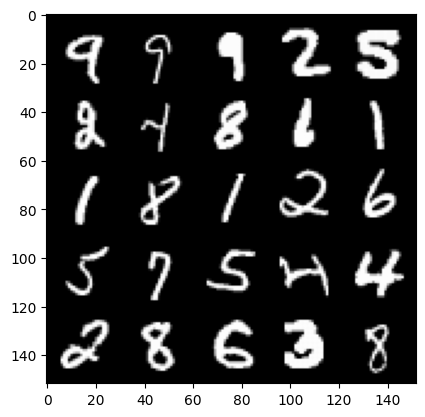

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 3.832888802528381, discriminator loss: 0.09077784262597544


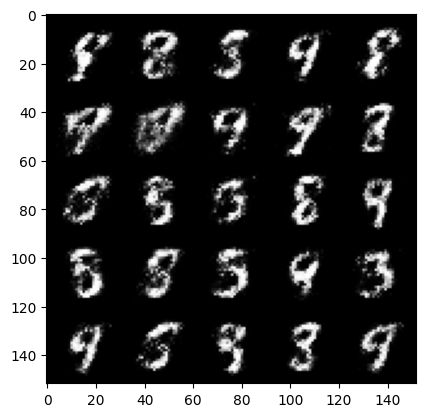

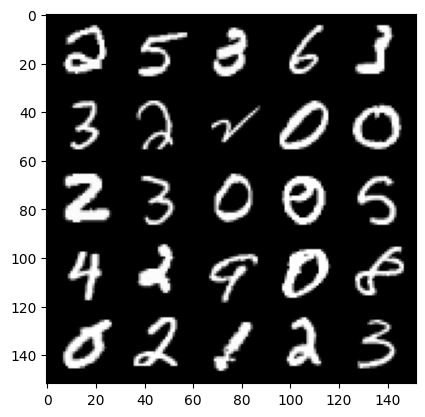

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 3.7276183452606197, discriminator loss: 0.11059718613326543


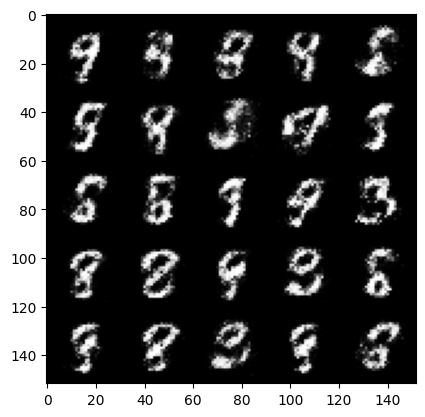

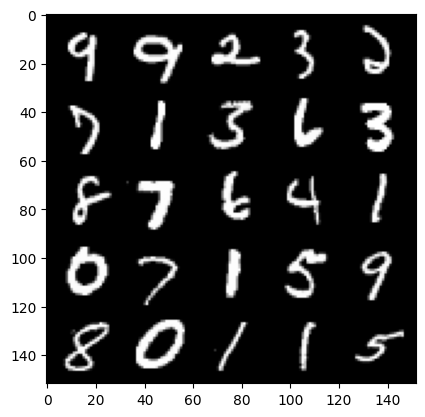

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 3.5694466724395757, discriminator loss: 0.12689457499980922


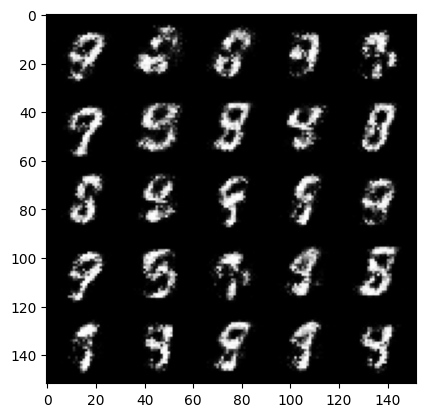

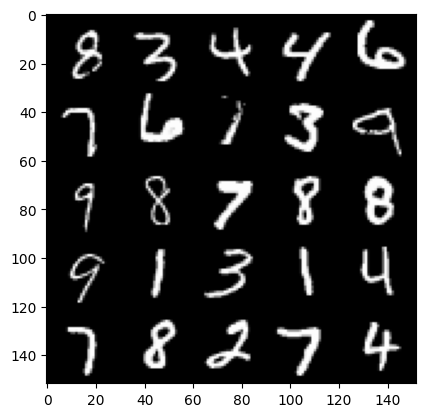

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 3.621940501213075, discriminator loss: 0.11461047869920729


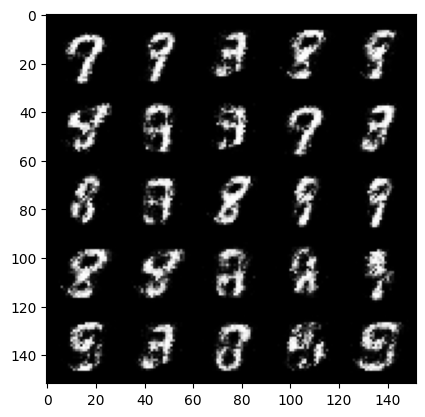

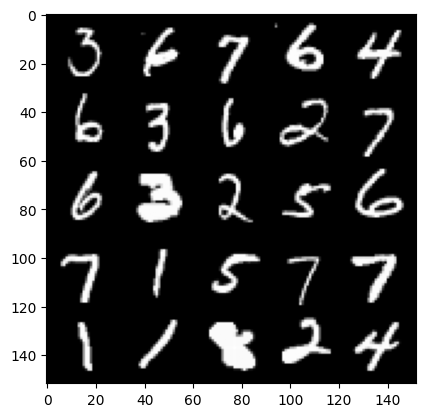

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 3.593162321090701, discriminator loss: 0.12059367014467719


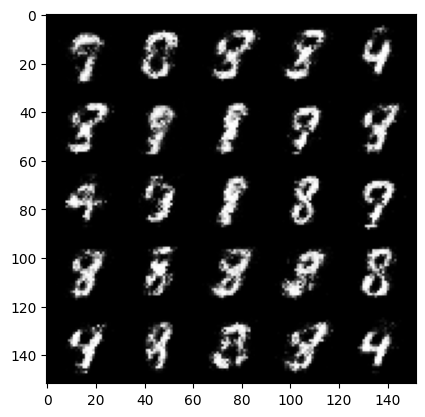

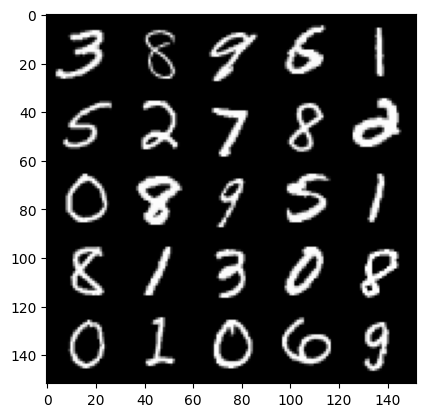

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 3.4188934230804446, discriminator loss: 0.13133340327441684


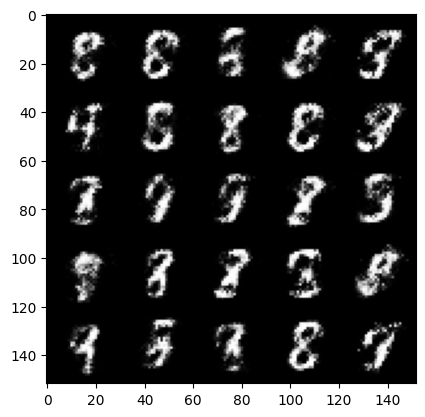

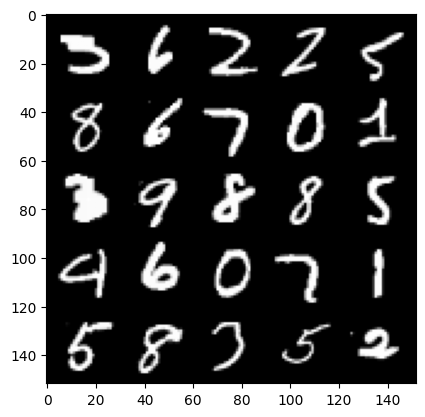

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 3.3854645328521773, discriminator loss: 0.1320400856286289


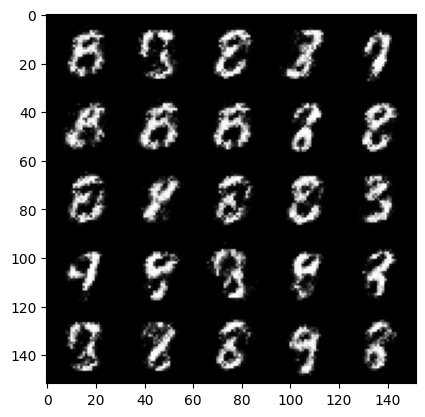

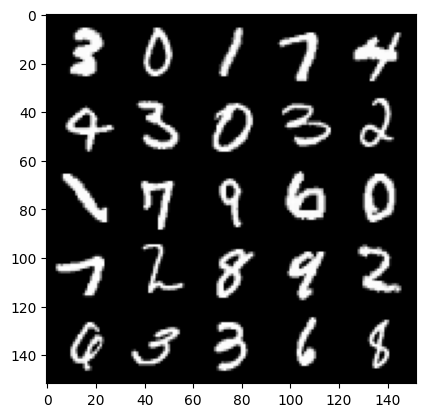

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 3.3298566880226144, discriminator loss: 0.14853543169796454


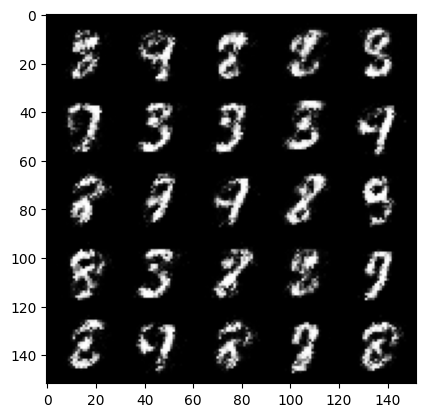

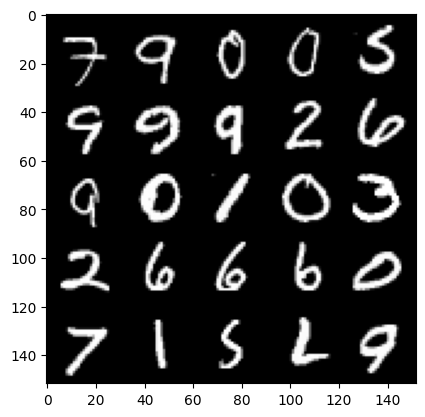

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 3.3836503458023035, discriminator loss: 0.14035785485804075


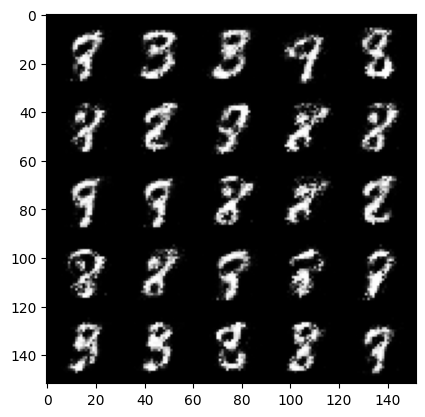

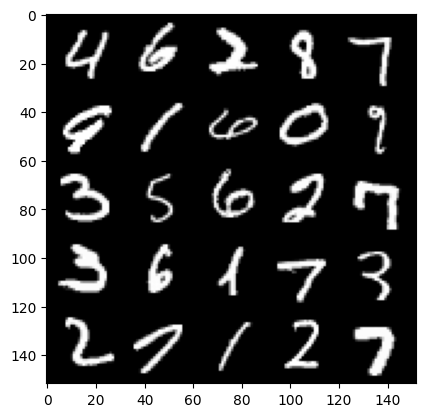

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 3.5162938113212605, discriminator loss: 0.14138709940016275


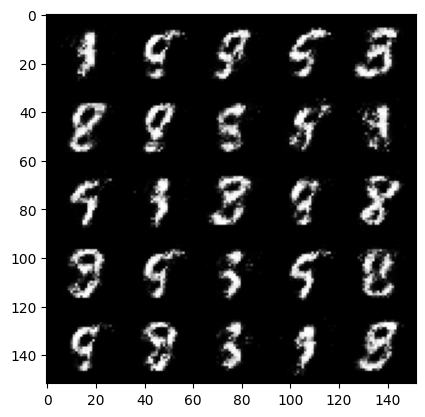

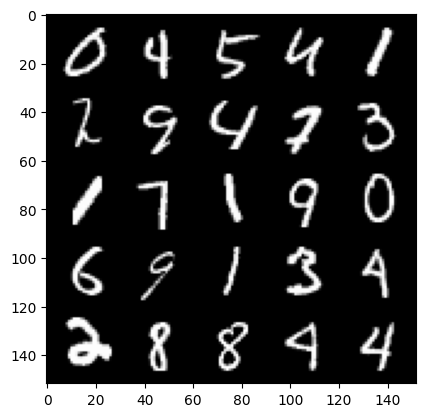

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 3.442150086402895, discriminator loss: 0.15666740208864202


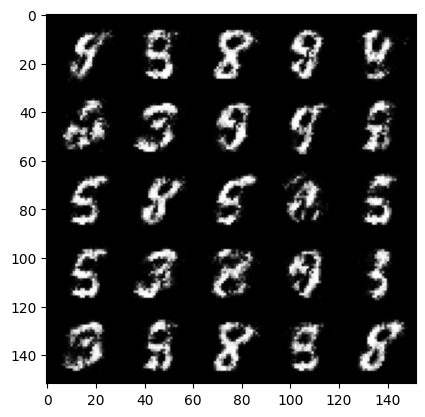

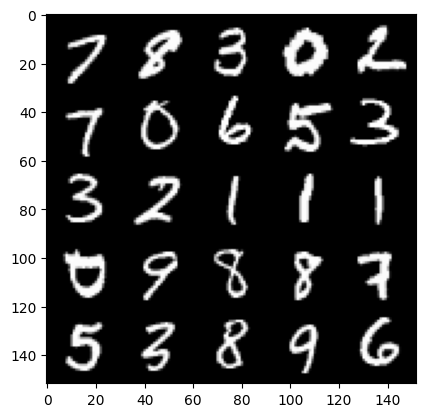

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 3.3061872925758347, discriminator loss: 0.16649390369653702


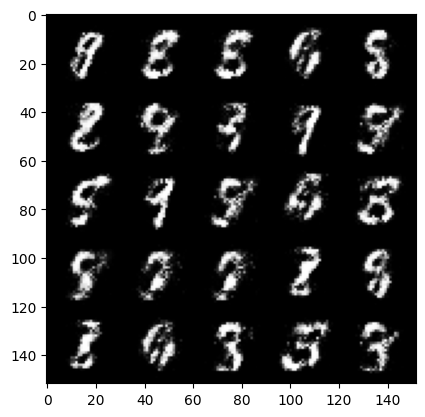

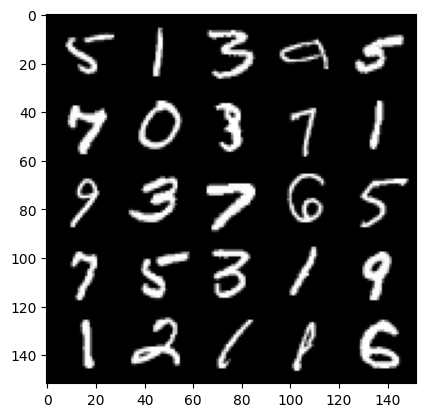

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 3.2773846459388767, discriminator loss: 0.1549479056447745


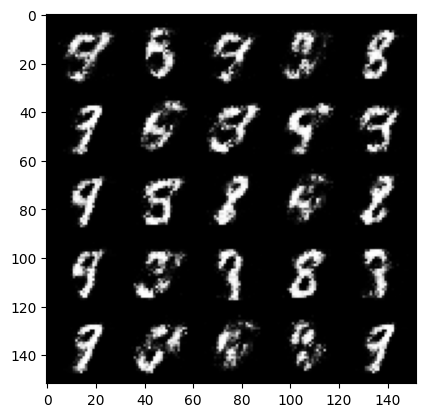

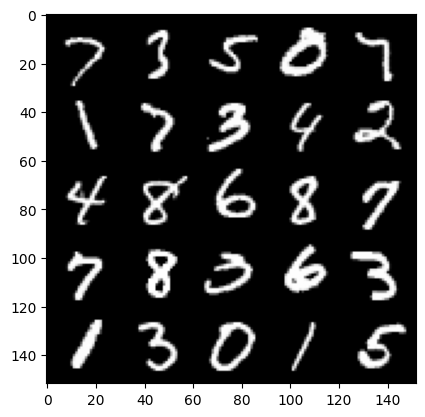

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 3.2469094166755665, discriminator loss: 0.16169936978816993


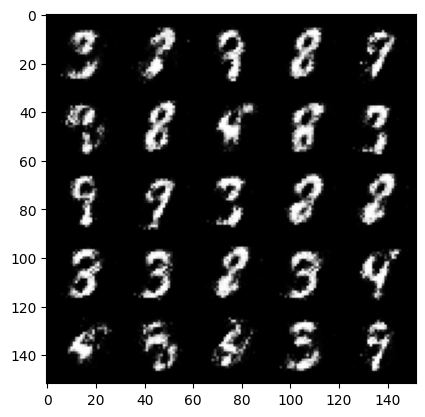

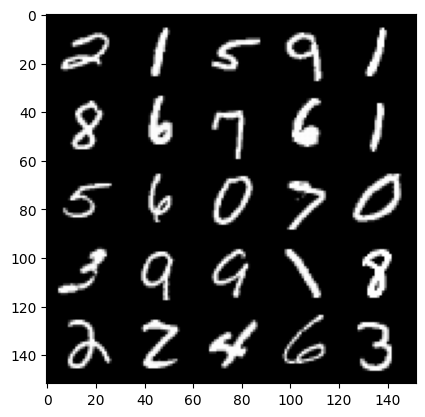

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 3.29085861492157, discriminator loss: 0.1563850270211697


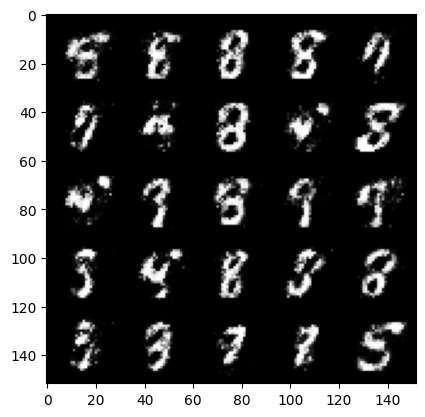

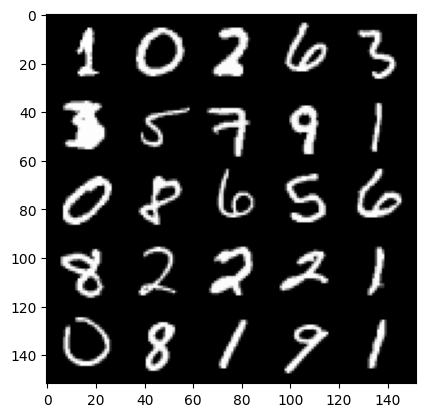

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 3.3627970528602598, discriminator loss: 0.15436116999387747


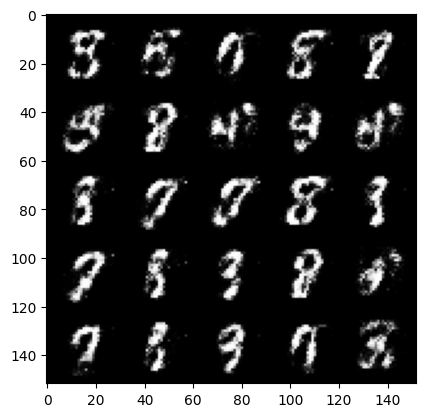

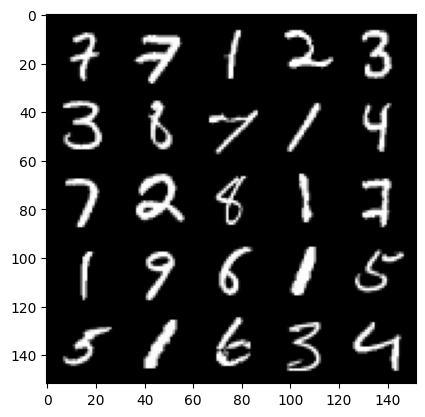

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 3.184910245418547, discriminator loss: 0.16536776933073993


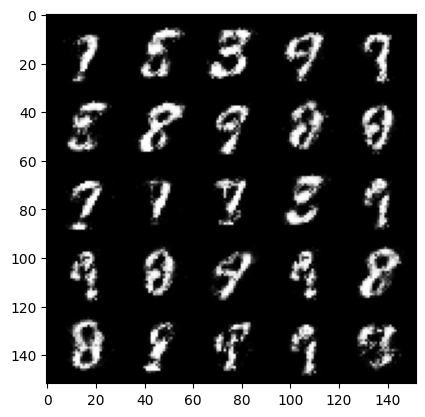

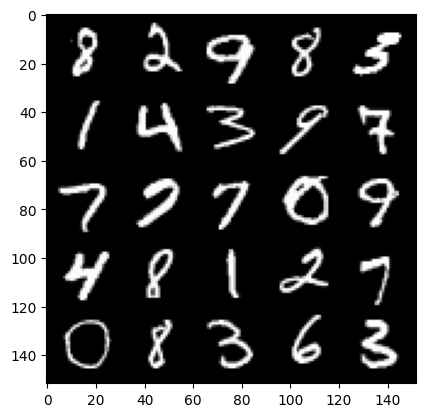

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 3.084602818965911, discriminator loss: 0.18163040201365951


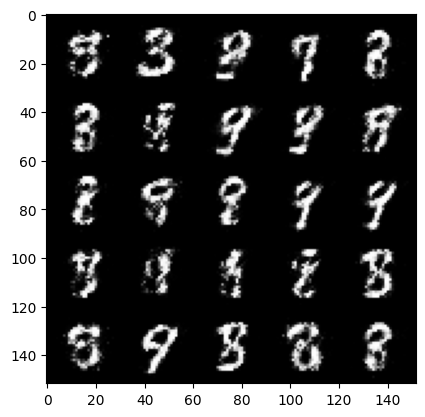

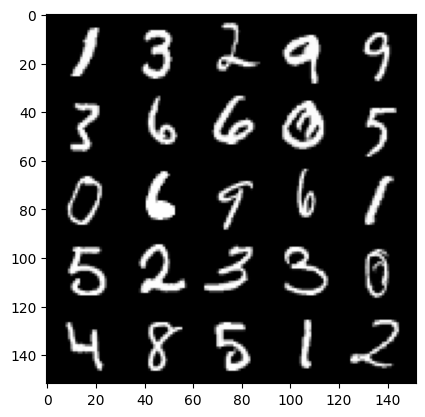

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 3.1279903583526654, discriminator loss: 0.17511788180470464


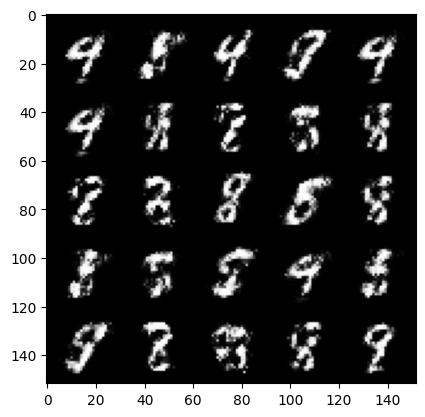

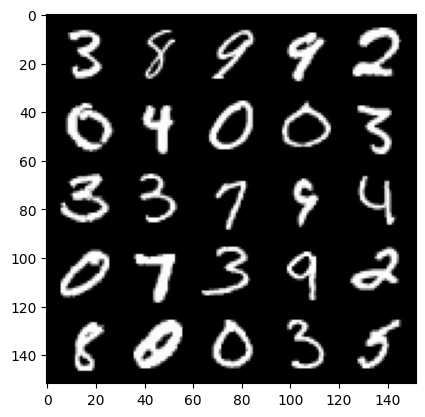

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 3.2469622635841393, discriminator loss: 0.15749128235876544


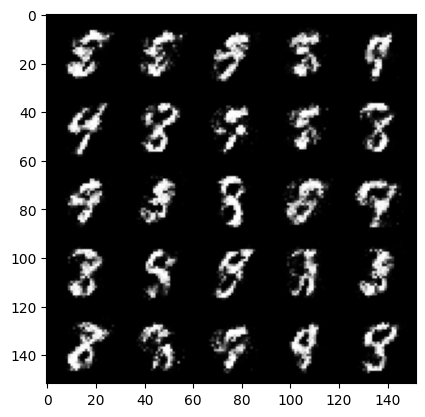

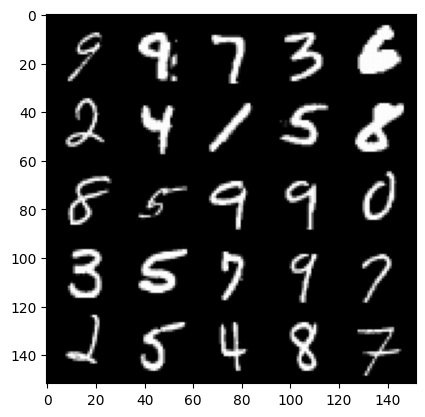

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 3.047252655506135, discriminator loss: 0.18353174264729016


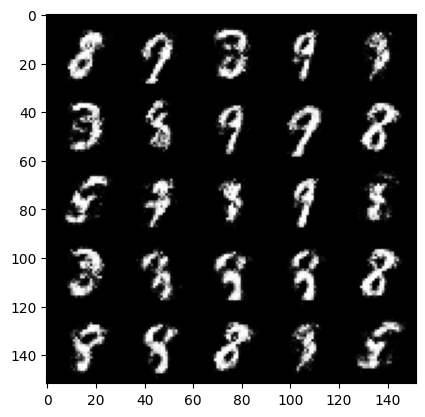

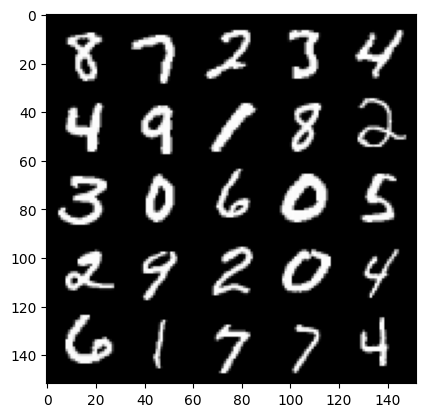

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator loss: 2.9389979109764104, discriminator loss: 0.18859926456212994


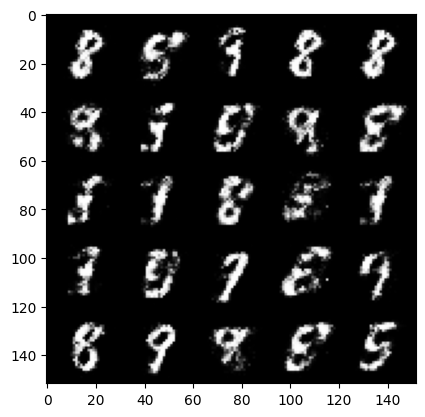

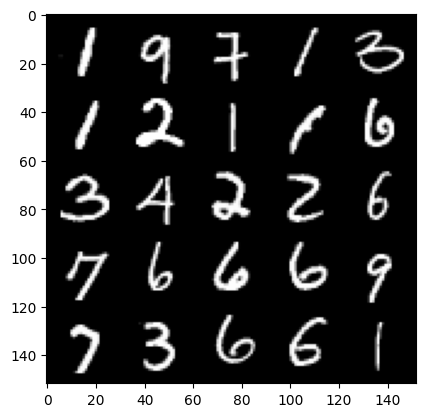

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 2.9540328578948944, discriminator loss: 0.18891505792737015


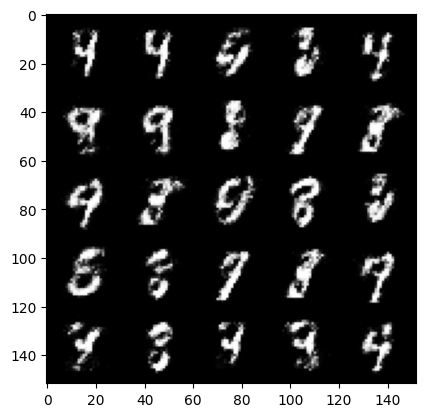

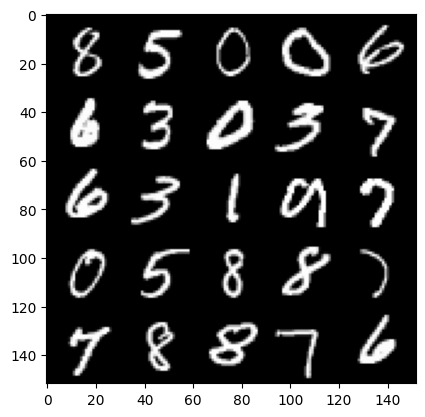

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator loss: 2.8477872548103353, discriminator loss: 0.1969711196571586


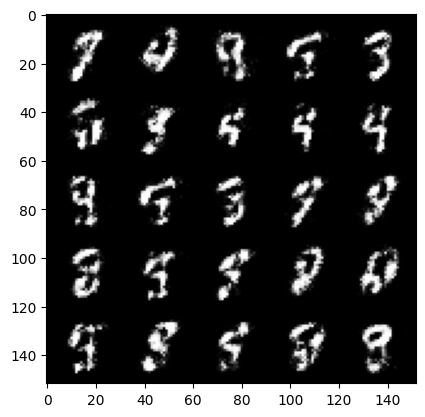

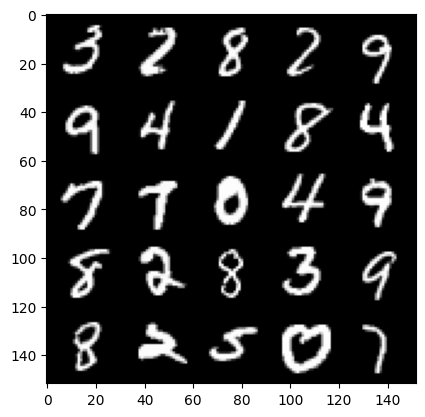

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 2.8436795301437394, discriminator loss: 0.1972899337112905


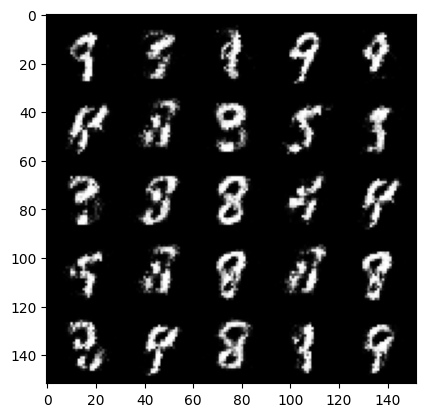

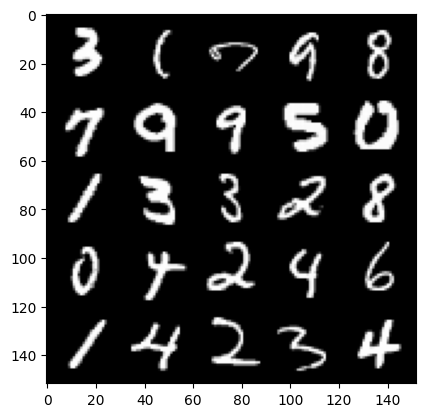

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator loss: 2.8881968679428116, discriminator loss: 0.20259350647032243


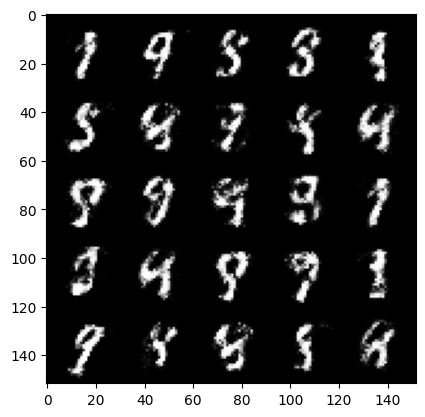

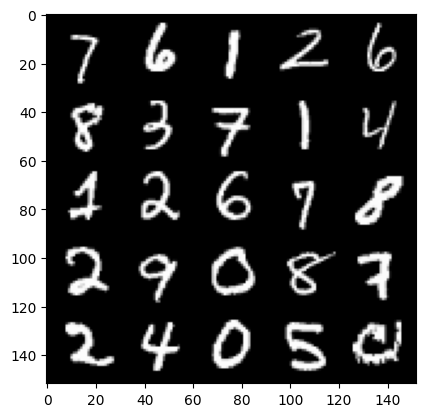

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 2.799242115974428, discriminator loss: 0.2056692095845939


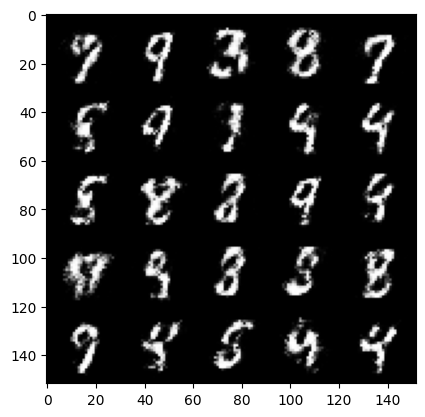

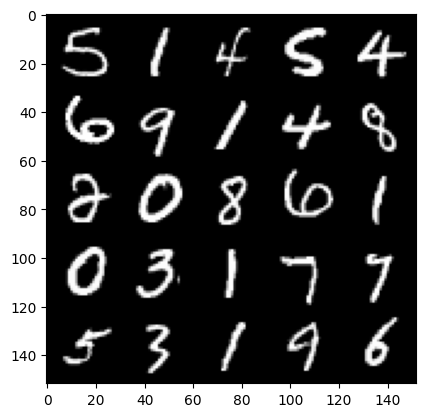

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator loss: 2.7790707440376266, discriminator loss: 0.21310309720039372


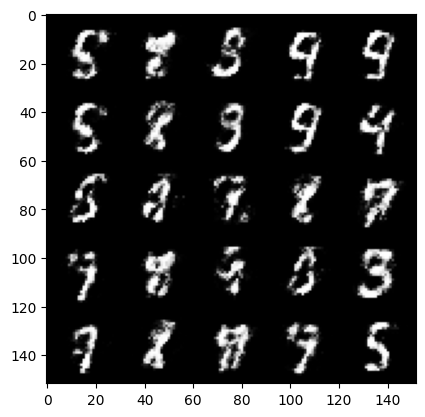

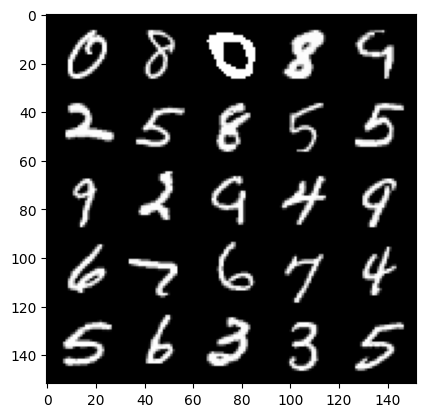

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 2.841800702571871, discriminator loss: 0.2002320175468921


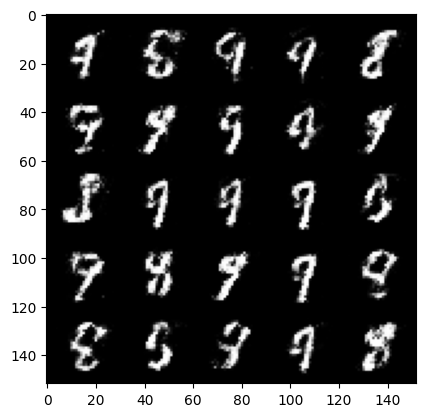

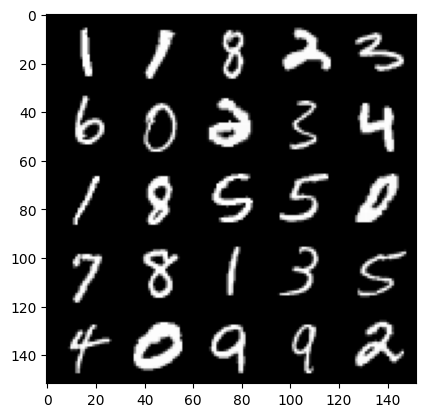

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator loss: 2.746001745223998, discriminator loss: 0.2300365957021714


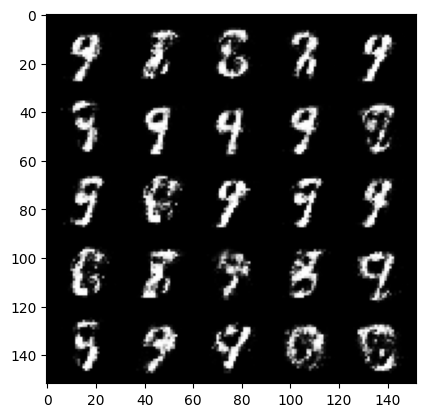

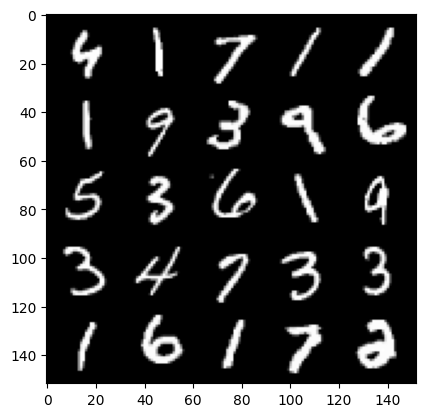

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 2.7327800474166852, discriminator loss: 0.23135911044478413


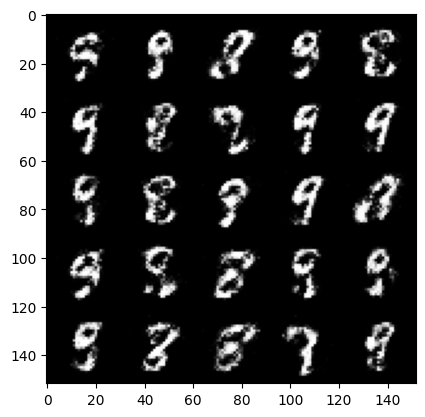

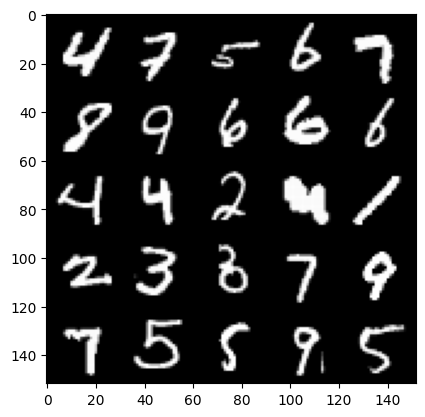

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator loss: 2.6113724794387836, discriminator loss: 0.2462012925446032


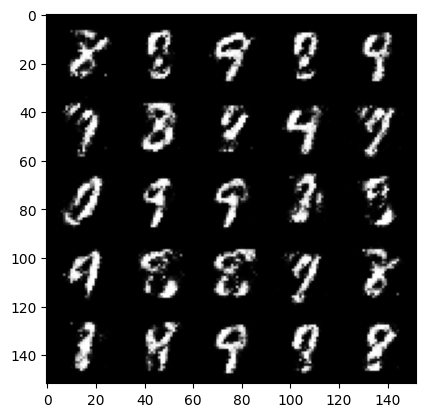

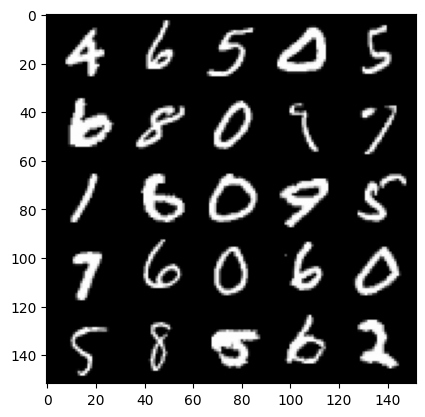

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 2.5901007106304177, discriminator loss: 0.2448733936250209


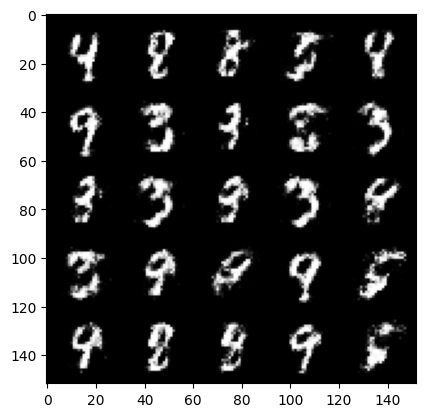

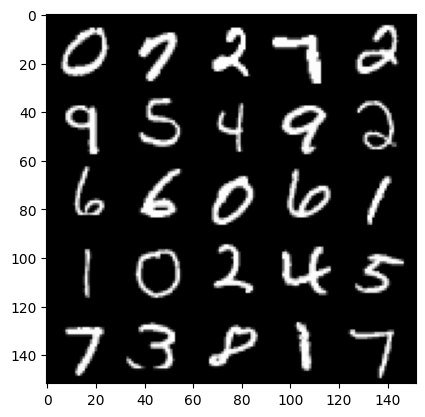

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator loss: 2.6787917480468733, discriminator loss: 0.23240330690145478


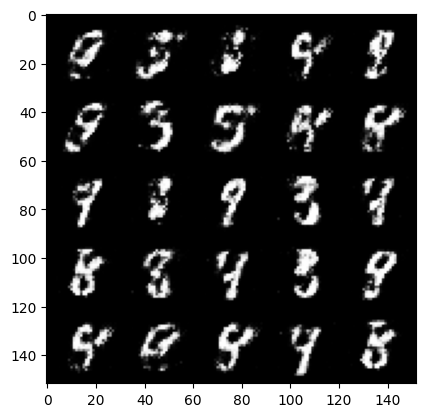

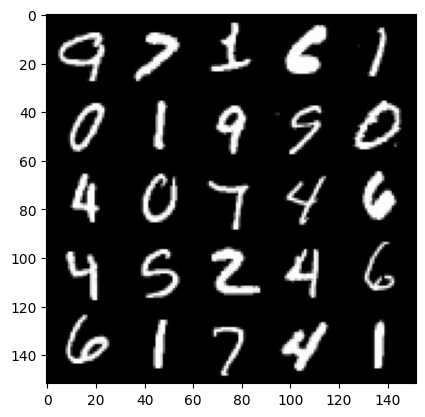

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 2.6397053780555737, discriminator loss: 0.2209964439272885


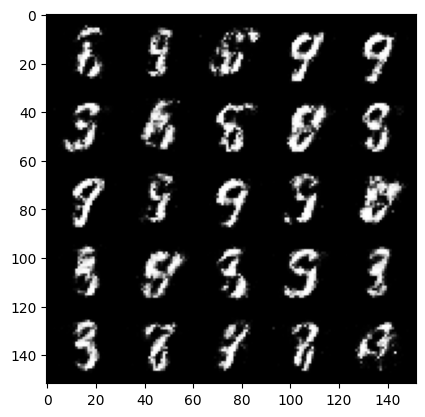

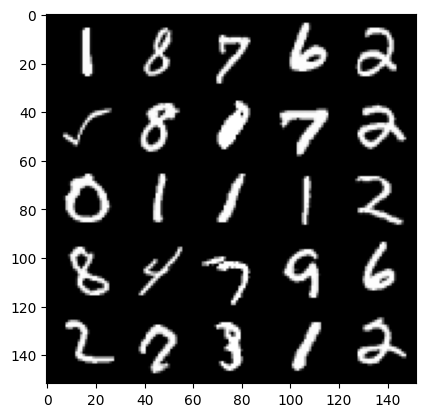

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 2.6268438644409167, discriminator loss: 0.23613993567228328


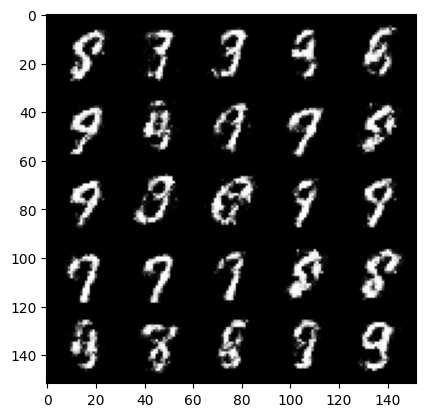

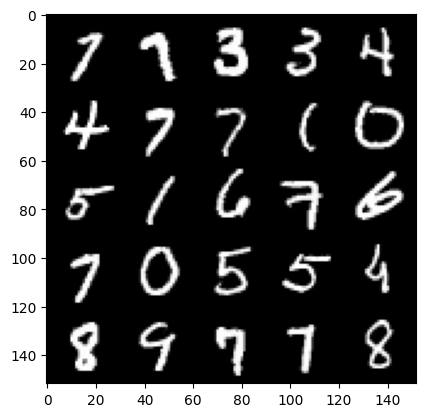

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 2.576427430152894, discriminator loss: 0.26069735068082794


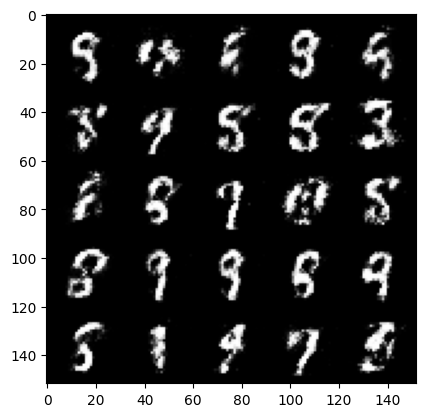

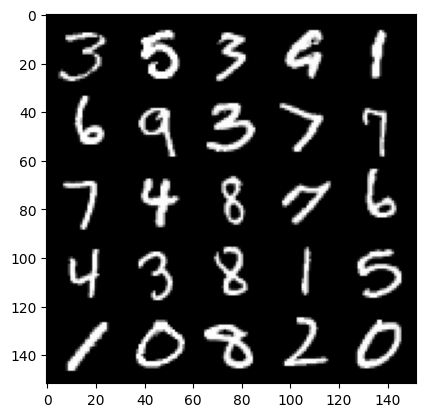

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 2.456549994707106, discriminator loss: 0.25972217363119116


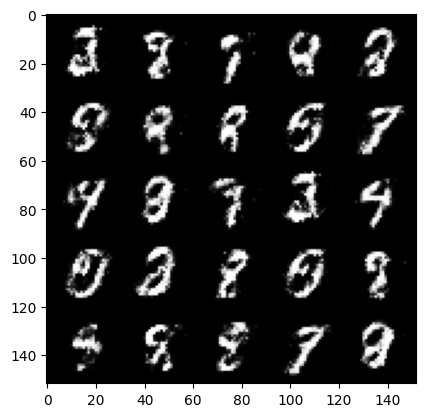

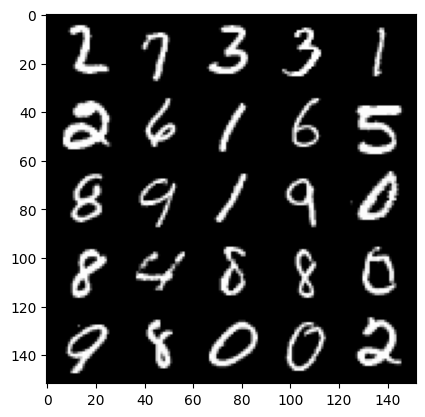

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 2.401436512231826, discriminator loss: 0.26831518882513034


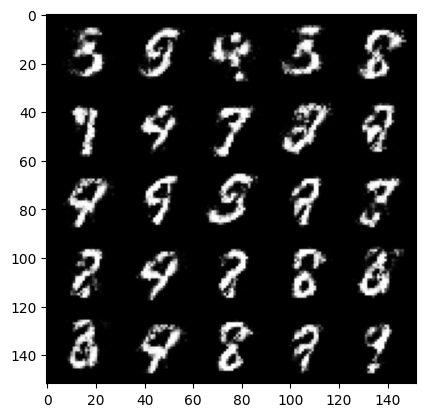

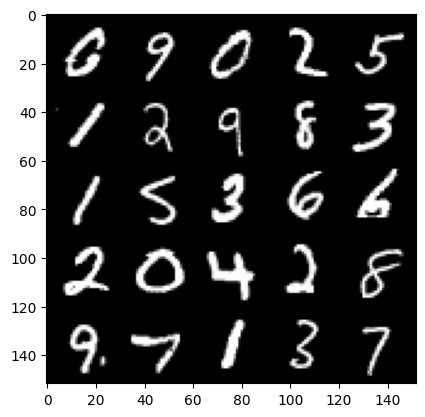

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator loss: 2.398644105434418, discriminator loss: 0.2707018847465515


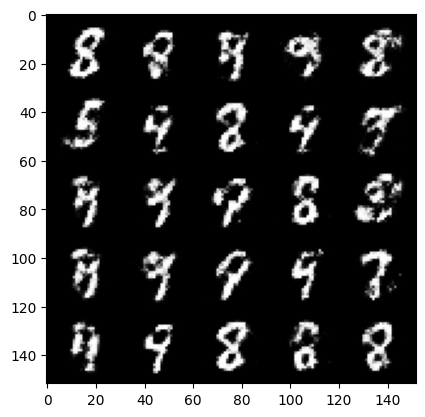

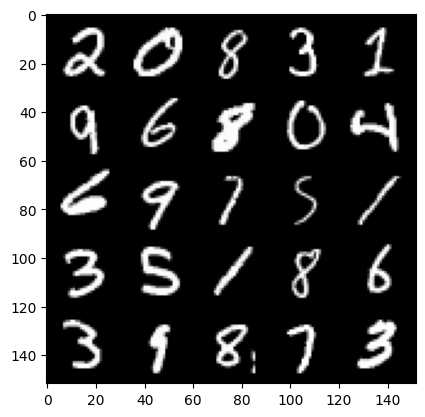

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 2.2628752639293666, discriminator loss: 0.2900693438649174


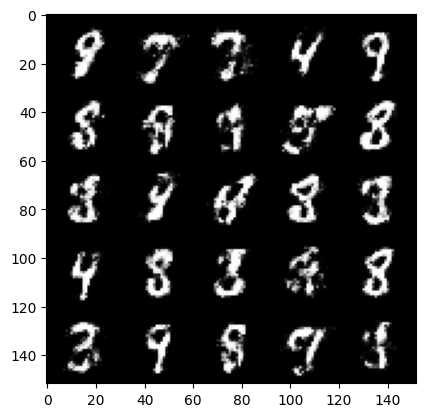

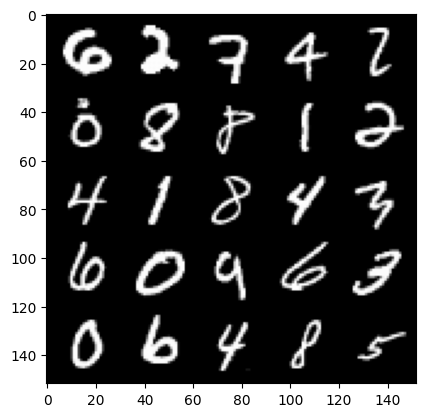

  0%|          | 0/469 [00:00<?, ?it/s]

In [ ]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        real = real.view(cur_batch_size, -1).to(device)

        disc_opt.zero_grad()

        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        disc_loss.backward(retain_graph=True)

        disc_opt.step()

        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()

        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        mean_discriminator_loss += disc_loss.item() / display_step

        mean_generator_loss += gen_loss.item() / display_step

        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
